In [1]:
TRAIN = '/kaggle/input/celebrity-database-332-names/dataset'

In [2]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
import numpy as np


DEVICE = torch.device('cpu')
OUTPUT_SIZE = 2048

model = models.resnext50_32x4d(weights=models.ResNeXt50_32X4D_Weights.IMAGENET1K_V2)

extraction_layer = model._modules.get('avgpool')
model.to(DEVICE)
model.eval()

scaler = transforms.Resize((224, 224))
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
to_tensor = transforms.ToTensor()

def get_vec(arg, model, extraction_layer):
    image = normalize(to_tensor(scaler(arg))).unsqueeze(0).to(DEVICE)
    result = torch.zeros(1, OUTPUT_SIZE, 1, 1)
    def copy_data(m, i, o):
        result.copy_(o.data)
    hooked = extraction_layer.register_forward_hook(copy_data)
    with torch.no_grad():
        model(image)
    hooked.remove()
    return result

Downloading: "https://download.pytorch.org/models/resnext50_32x4d-1a0047aa.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-1a0047aa.pth


100%|██████████| 95.8M/95.8M [00:00<00:00, 169MB/s]


In [3]:
import os
import pathlib


KEEP = list(pathlib.Path('/kaggle/input/celebrity-database-332-names/dataset').iterdir())[:10]
KEEP = [os.path.basename(item) for item in KEEP]
KEEP = set(KEEP)
KEEP

{'Ajay_Devgn',
 'Bismah Maroof',
 'Dulquer Salmaan',
 'Kriti_Sanon',
 'Nani actor',
 'Randeep_Hooda',
 'Sai Pallavi',
 'Sreeleela',
 'Sunny_Deol',
 'Tom Holland'}

In [4]:
import arrow
import base64
import pandas as pd
from glob import iglob
from io import BytesIO
from os.path import basename
from os.path import isdir
from PIL import Image

THUMBNAIL_SIZE = (64, 64)

def embed(model, filename: str):
    with Image.open(fp=filename, mode='r') as image:
        return get_vec(arg=image.convert('RGB'), model=model, extraction_layer=extraction_layer).numpy().reshape(OUTPUT_SIZE,)


# https://stackoverflow.com/a/952952
def flatten(arg):
    return [x for xs in arg for x in xs]

def png(filename: str) -> str:
    with Image.open(fp=filename, mode='r') as image:
        buffer = BytesIO()
        # our images are pretty big; let's shrink the hover images to thumbnail size
        image.resize(size=THUMBNAIL_SIZE).convert('RGBA').save(buffer, format='png')
        return 'data:image/png;base64,' + base64.b64encode(buffer.getvalue()).decode()

def get_picture_from_glob(arg: str, tag: str,) -> list:
    time_get = arrow.now()
    result = [pd.Series(data=[tag, basename(input_file), embed(model=model, filename=input_file), png(filename=input_file)],
                        index=['tag', 'name', 'value', 'png'] )
        for index, input_file in enumerate(list(iglob(pathname=arg)))]
    print('encoded {} rows of {}  in {}'.format(len(result), tag, arrow.now() - time_get))
    return result

time_start = arrow.now()
train_dict = {basename(folder) : folder + '/*.*' for folder in iglob(TRAIN + '/*') if isdir(folder) and basename(folder) in KEEP}
train_df = pd.DataFrame(data=flatten(arg=[get_picture_from_glob(arg=value, tag=key) for key, value in train_dict.items()]))
print('done in {}'.format(arrow.now() - time_start))

encoded 141 rows of Ajay_Devgn  in 0:00:22.345303
encoded 91 rows of Dulquer Salmaan  in 0:00:18.793821
encoded 65 rows of Sai Pallavi  in 0:00:08.706069
encoded 126 rows of Bismah Maroof  in 0:00:17.793065
encoded 61 rows of Nani actor  in 0:00:11.325916
encoded 135 rows of Kriti_Sanon  in 0:00:22.833922
encoded 92 rows of Sunny_Deol  in 0:00:13.711524
encoded 128 rows of Randeep_Hooda  in 0:00:19.323685
encoded 80 rows of Tom Holland  in 0:00:17.599208
encoded 95 rows of Sreeleela  in 0:00:19.378585
done in 0:02:52.211576


In [5]:
ls /kaggle/input/celebrity-database-332-names/dataset

 Aamir_Khan/                  'Marvan Atapattu'/
'AB de Villiers'/             'Mashrafe Mortaza'/
 Abhay_Deol/                  'Matheesha Pathirana'/
 Abhishek_Bachchan/           'Max Verstappen'/
'Adam Gilchrist'/             'Megan Fox'/
 Aftab_Shivdasani/            'Michael Ondaatje'/
'Aishwarya Lekshmi'/          'Mike Tyson'/
 Aishwarya_Rai/               'Mitchell Starc'/
 Ajay_Devgn/                   mithali_raj/
 Akshaye_Khanna/               Mohanlal/
 Akshay_Kumar/                 Mrunal_Thakur/
 Alia_Bhatt/                   ms_dhoni/
'Alka Yagnik'/                'Muhammad Ali'/
'Amala Paul'/                 'Muttiah Muralitharan'/
 Ameesha_Patel/                Nagarjuna/
 Amitabh_Bachchan/            'Namal Rajapaksa'/
 Amrita_Rao/                   Nana_Patekar/
 Amy_Jackson/                 'Nanda Malini'/
'Andre Russell'/              'Nani actor'/
'Angelina Jolie'/              Nargis_Fakhri/
 Anil_Kapoor/                  Naseeruddin_Shah/
'Anne Hathaway'/      

In [6]:
from sklearn.manifold import TSNE

train_reducer = TSNE(random_state=2025, verbose=True, n_jobs=1, perplexity=20.0, init='pca')
train_df[['x', 'y']] = train_reducer.fit_transform(X=train_df['value'].apply(func=pd.Series))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1014 samples in 0.006s...
[t-SNE] Computed neighbors for 1014 samples in 0.240s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1014
[t-SNE] Computed conditional probabilities for sample 1014 / 1014
[t-SNE] Mean sigma: 7.997807
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.627525
[t-SNE] KL divergence after 1000 iterations: 0.548881


In [7]:
from bokeh.models import ColumnDataSource
from bokeh.models import HoverTool

from bokeh.plotting import figure
from bokeh.plotting import output_notebook
from bokeh.plotting import show
from bokeh.palettes import Turbo256
from bokeh.transform import factor_cmap

output_notebook()

datasource = ColumnDataSource(train_df[['png', 'tag', 'x', 'y']].sample(n=min(len(train_df) - 1, 10000)))
factor_count = max(train_df['tag'].nunique(), 3)
indices = np.linspace(0, len(Turbo256)-1, factor_count, dtype=int)
palette = [Turbo256[index] for index in indices]
mapper = factor_cmap(field_name = 'tag', palette=palette, factors=train_df['tag'].unique().tolist(), start=0, end=factor_count-1, )

plot_figure = figure(title='TSNE projection: famous faces', width=1000, height=800, tools=('pan, wheel_zoom, reset'))

plot_figure.add_tools(HoverTool(tooltips="""
<div>
    <div>
        <img src='@png' style='float: left; margin: 5px 5px 5px 5px'/>
    </div>
    <div>
        <span style='font-size: 18px'>@tag</span>
    </div>
</div>
"""))

plot_figure.scatter(x='x', y='y', source=datasource, line_alpha=0.6, fill_alpha=0.6, size=8, color=mapper)
show(plot_figure)

Loading BokehJS ...

In [8]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(train_df['value'].apply(pd.Series), train_df['tag'], test_size=0.25, random_state=2025, stratify=train_df['tag'])
logreg = LogisticRegression(max_iter=10000, tol=1e-12).fit(X_train, y_train)
print('model fit in {} iterations'.format(logreg.n_iter_[0]))
print('accuracy: {:5.4f}'.format(accuracy_score(y_true=y_test, y_pred=logreg.predict(X=X_test))))
print('f1: {:5.4f}'.format(f1_score(average='weighted', y_true=y_test, y_pred=logreg.predict(X=X_test))))
print(classification_report(y_true=y_test, y_pred=logreg.predict(X=X_test), zero_division=0.0))

model fit in 634 iterations
accuracy: 0.9921
f1: 0.9921
                 precision    recall  f1-score   support

     Ajay_Devgn       0.95      1.00      0.97        35
  Bismah Maroof       1.00      1.00      1.00        32
Dulquer Salmaan       1.00      1.00      1.00        23
    Kriti_Sanon       1.00      1.00      1.00        34
     Nani actor       1.00      1.00      1.00        15
  Randeep_Hooda       1.00      0.94      0.97        32
    Sai Pallavi       1.00      1.00      1.00        16
      Sreeleela       1.00      1.00      1.00        24
     Sunny_Deol       1.00      1.00      1.00        23
    Tom Holland       1.00      1.00      1.00        20

       accuracy                           0.99       254
      macro avg       0.99      0.99      0.99       254
   weighted avg       0.99      0.99      0.99       254



<Axes: xlabel='probability', ylabel='Count'>

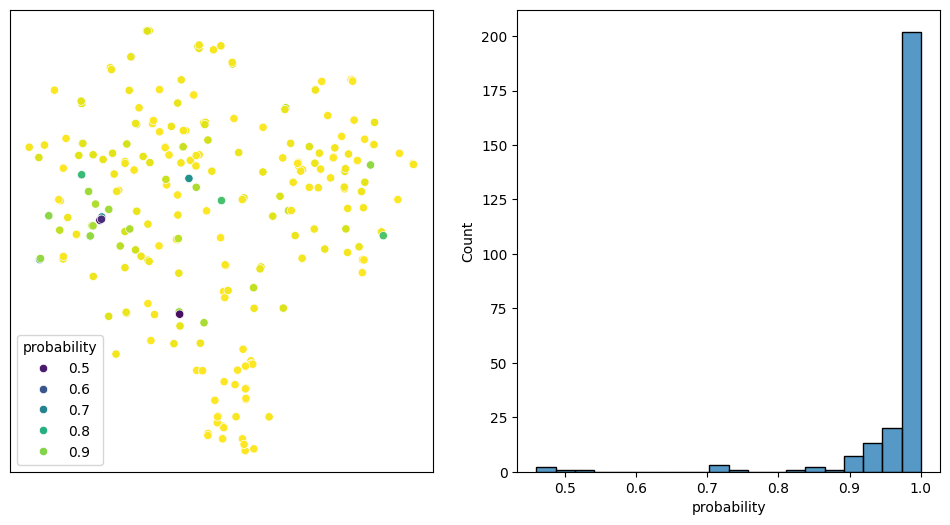

In [9]:
import matplotlib.pyplot as plt
import warnings
from seaborn import histplot
from seaborn import scatterplot

warnings.filterwarnings('ignore', category=FutureWarning, module='seaborn')

plot_df = train_df.iloc[X_test.index][['x', 'y']].copy()
plot_df['probability'] = np.max(logreg.predict_proba(X=X_test), axis=1)

plt, ax = plt.subplots(ncols=2, figsize=(12, 6))
scatterplot(ax=ax[0], data=plot_df, x='x', y='y', hue='probability', palette='viridis', )
ax[0].set(xlabel=None) 
ax[0].set(ylabel=None)
ax[0].set(xticklabels=[])
ax[0].set(yticklabels=[])
ax[0].tick_params(axis='both', which='both', length=0)
histplot(ax=ax[1], data=plot_df, x='probability', bins=20)